# Altairで「マンガ雑誌のデータ」の図を作り直す

今回は、文化庁の[メディア芸術データベース・ラボ（MADB Lab）](https://mediag.bunka.go.jp/madb_lab/)で公開されている四大少年誌（週刊少年サンデー、週刊少年ジャンプ、週刊少年チャンピオン、週刊少年マガジン）のデータを使って、量的データと質的データの可視化を練習します。

まず、「四大少年誌それぞれの掲載作品のジャンルと著者にはどのような特徴があるのか？」という大きな問いを立て、可視化手法を学びながらデータを見て、具体的な問いを決めていきましょう。

[マンガと学ぶデータビジュアライゼーション](https://kakeami.github.io/viz-madb/index.html)の内容を全面的に参考にし、一部改変しています。

[Plotlyで作られた図](./visualizing-quantitative-and-qualitative-data.ipynb)の中から、好きな図を3つ選んで、Altairで再現しましょう。

再現する時には、変数の性質（名義、順序、間隔、比例）に注意して、どのタイプの図がどの変数をうまく扱えるかを考えてみましょう。

複雑な図を再現したい時は、[Altair Example Gallery](https://altair-viz.github.io/gallery/index.html)を参考にしてみてください。

## ライブラリの読み込み

In [29]:
# ライブラリのインストール。必要に応じてコメントアウトする。
# !pip install altair

In [30]:
import pandas as pd

import altair as alt

In [31]:
import itertools
import warnings
warnings.filterwarnings('ignore')

In [32]:
# 5000行の制限をはずす
alt.data_transformers.disable_max_rows()

DataTransformerRegistry.enable('default')

## 準備関数

In [33]:
# weekdayを曜日に変換
WD2STR = {
    0: 'Mon.',
    1: 'Tue.',
    2: 'Wed.',
    3: 'Thu.',
    4: 'Fri.',
    5: 'Sat.',
    6: 'Sun.',}

In [34]:
def add_years_to_df(df, unit_years=10):
    """unit_years単位で区切ったyears列を追加"""
    df_new = df.copy()
    df_new['years'] = \
        pd.to_datetime(df['datePublished']).dt.year \
        // unit_years * unit_years
    df_new['years'] = df_new['years'].astype(str)
    return df_new

In [35]:
def add_weekday_to_df(df):
    """曜日情報をdfに追加"""
    df_new = df.copy()
    df_new['weekday'] = \
        pd.to_datetime(df_new['datePublished']).dt.weekday
    df_new['weekday_str'] = df_new['weekday'].apply(
        lambda x: WD2STR[x])
    return df_new

In [36]:
def add_mcid_to_df(df):
    """mcnameのindexをdfに追加"""
    df_new = df.copy()
    mcname2mcid = {
        x: i for i, x in enumerate(df['mcname'].unique())}
    df_new['mcid'] = df_new['mcname'].apply(
        lambda x: mcname2mcid[x])
    return df_new

In [37]:
def resample_df_by_cname_and_years(df):
    """cnameとyearsのすべての組み合わせが存在するように0埋め
    この処理を実施しないと作図時にX軸方向の順序が変わってしまう"""
    df_new = df.copy()
    yearss = df['years'].unique()
    cnames = df['cname'].unique()
    for cname, years in itertools.product(cnames, yearss):
        df_tmp = df_new[
            (df_new['cname'] == cname)&\
            (df_new['years'] == years)]
        if df_tmp.shape[0] == 0:
            s = pd.DataFrame(
                {'cname': cname,
                 'years': years,
                 'weeks': 0,},
                index=df_tmp.columns)
            df_new = pd.concat(
                [df_new, s], ignore_index=True)
    return df_new

In [38]:
def resample_df_by_creator_and_years(df):
    """creatorとyearsのすべての組み合わせが存在するように0埋め
    この処理を実施しないと作図時にX軸方向の順序が変わってしまう"""
    df_new = df.copy()
    yearss = df['years'].unique()
    creators = df['creator'].unique()
    for creator, years in itertools.product(creators, yearss):
        df_tmp = df_new[
            (df_new['creator'] == creator)&\
            (df_new['years'] == years)]
        if df_tmp.shape[0] == 0:
            s = pd.Series(
                {'creator': creator,
                 'years': years,
                 'weeks': 0,},
                index=df_tmp.columns)
            df_new = pd.concat(
                [df_new, s], ignore_index=True)
    return df_new

## データの用意

四大少年誌の`1970-07-27`から`2017-07-06`までの全ての掲載作品のデータを使います。

すでに前処理がされているデータがあるので、そちらを使います。

In [39]:
file = "./data/episodes.csv"

In [40]:
df = pd.read_csv(file)

In [41]:
df.shape

(179931, 17)

各週の掲載作品を一行ずつ格納しているため、合計で約18万行程度になります。

In [42]:
df.columns

Index(['mcname', 'miid', 'miname', 'cid', 'cname', 'epname', 'creator',
       'pageStart', 'pageEnd', 'numberOfPages', 'datePublished', 'price',
       'publisher', 'editor', 'pages', 'pageEndMax', 'pageStartPosition'],
      dtype='object')

- `mcname`: 雑誌名（**M**gazine **C**ollection **NAME**）
- `miid`：雑誌巻号ID（**M**agazine **I**tem **ID**）
- `miname`: 雑誌巻号名（**M**agazine **I**tem **NAME**）
- `cid`: マンガ作品ID（**C**omic **ID**）
- `cname`: マンガ作品名（**C**omic **NAME**）
- `epname`: 各話タイトル（**EP**isode **NAME**）
- `creator`: 作者名
- `pageStart`: 開始ページ
- `pageEnd`: 終了ページ
- `numberOfPages`: 雑誌の合計ページ数
- `datePublished`: 雑誌の発行日
- `price`: 雑誌の価格
- `publisher`: 雑誌の出版社
- `editor`: 雑誌の編集者（編集長）
- `pages`: 各話のページ数（`pageEnd` - `pageStart` + 1）
- `pageEndMax`: 雑誌に掲載されているマンガ作品のうち，`pageEnd`の最大値
- `pageStartPosition`: 各話の`pageStart`の相対的な位置（`pageStart` / `pageEndMax`）

In [43]:
df.head()

,mcname,miid,miname,cid,cname,epname,creator,pageStart,pageEnd,numberOfPages,datePublished,price,publisher,editor,pages,pageEndMax,pageStartPosition
0,週刊少年ジャンプ,M616363,週刊少年ジャンプ 1970年 表示号数31,C88180,男一匹ガキ大将,土佐の源蔵の巻,本宮ひろ志,7.0,37.0,280.0,1970-07-27,80.0,集英社,長野規,31.0,275.0,0.025455
1,週刊少年チャンピオン,M558279,週刊少年チャンピオン 1970年 表示号数14,C94272,朝日の恋人,NaN,かざま鋭二,15.0,43.0,292.0,1970-07-27,80.0,秋田書店 ∥ アキタショテン,成田清美,29.0,290.0,0.051724
2,週刊少年ジャンプ,M616363,週刊少年ジャンプ 1970年 表示号数31,C87448,ど根性ガエル,男はつらいよの巻,吉沢やすみ,39.0,53.0,280.0,1970-07-27,80.0,集英社,長野規,15.0,275.0,0.141818
3,週刊少年チャンピオン,M558279,週刊少年チャンピオン 1970年 表示号数14,C94289,あばしり一家,アバシリ吉三の美人地獄編,永井豪,48.0,66.0,292.0,1970-07-27,80.0,秋田書店 ∥ アキタショテン,成田清美,19.0,290.0,0.165517
4,週刊少年ジャンプ,M616363,週刊少年ジャンプ 1970年 表示号数31,C88021,あらし!三匹,ミヒル登場の巻,池沢さとし,56.0,70.0,280.0,1970-07-27,80.0,集英社,長野規,15.0,275.0,0.203636


In [44]:
df.describe()

,pageStart,pageEnd,numberOfPages,price,pages,pageEndMax,pageStartPosition
count,179931.000000,179931.000000,179624.000000,179893.000000,179931.000000,179931.000000,179931.000000
mean,210.845105,228.371240,417.376325,203.871740,18.526135,408.249379,0.514837
std,123.860878,122.038708,67.418723,41.955489,7.712730,69.804101,0.283146
min,1.000000,1.000000,36.000000,80.000000,1.000000,200.000000,0.002045
25%,107.000000,126.000000,356.000000,180.000000,17.000000,346.000000,0.274840
50%,205.000000,222.000000,437.000000,210.000000,19.000000,433.000000,0.520588
75%,305.000000,322.000000,464.000000,236.000000,20.000000,457.000000,0.759626
max,581.000000,600.000000,600.000000,371.000000,487.000000,600.000000,1.000000


欠損値を確認してみます。

特に`epname`と`publisher`の欠測が多いことがわかります．

In [45]:
df.isna().sum().reset_index()

,index,0
0,mcname,0
1,miid,0
2,miname,0
3,cid,9
4,cname,9
5,epname,26807
6,creator,441
7,pageStart,0
8,pageEnd,0
9,numberOfPages,307


## （例）Altairで再現1：作品別の掲載週数（上位20作品）

In [46]:
# 作品ごとの週数を数える
df_plot = df.value_counts("cname").reset_index(name="weeks").head(20)

In [47]:
alt.Chart(df_plot).mark_bar().encode(
    alt.X("cname:N", sort="-y", title="作品名"),
    alt.Y("weeks:Q", title="掲載週数"),
    alt.Tooltip(["weeks"])
).properties(
    title="作品ごとの掲載週数"
).configure_axis(
    labelFontSize=14,
    titleFontSize=16
).configure_title(
    fontSize=16
)

alt.Chart(...)

## （例）Altairで再現2：長期連載作品の掲載位置の分布

In [48]:
df_tmp = \
    df.groupby('cname')['pageStartPosition']\
    .agg(['count', 'mean']).reset_index()
df_tmp = \
    df_tmp.sort_values('count', ascending=False, ignore_index=True)\
    .head(10)
cname2position = df_tmp.groupby('cname')['mean'].first().to_dict()

In [49]:
df_plot = df[df['cname'].isin(list(cname2position.keys()))]\
    .reset_index(drop=True)
df_plot['position'] = df_plot['cname'].apply(
    lambda x: cname2position[x])
df_plot = df_plot.sort_values('position', ignore_index=True)

In [50]:
alt.Chart(df_plot).transform_density(
    'pageStartPosition',
    as_=['pageStartPosition', 'density'],
    extent=[0, 1],
    groupby=['cname']
).mark_area(orient='horizontal').encode(
    alt.Y('pageStartPosition:Q'),
    alt.X(
        'density:Q',
        stack='center',
        impute=None,
        title=None,
        axis=alt.Axis(labels=False, values=[0], grid=False, ticks=True)
    ),
    alt.Column(
        'cname:N'
    ),
    alt.Tooltip(['pageStartPosition:Q'])
).properties(
    width=100
).configure_facet(
    spacing=0
).configure_view(
    stroke=None
)

alt.Chart(...)

---

## Altairで再現1：[作品別・年代別の合計連載週数（上位20作品）]

In [51]:
pip install altair


Note: you may need to restart the kernel to use updated packages.


In [52]:
import pandas as pd
import altair as alt

file_path = "./data/episodes.csv"
df = pd.read_csv(file_path)

df['years'] = (pd.to_datetime(df['datePublished']).dt.year // 10) * 10

df_plot = df.groupby(['cname', 'years']).size().reset_index(name='weeks')
top_cnames = df['cname'].value_counts().head(20).index
df_plot = df_plot[df_plot['cname'].isin(top_cnames)]

chart = alt.Chart(df_plot).mark_bar().encode(
    x=alt.X('cname:N', 
            title='作品名', 
            sort='-y'),
    y=alt.Y('weeks:Q', 
            title='連載週数'),
    color=alt.Color('years:O', 
                    title='年代', 
                    scale=alt.Scale(scheme='tableau10')),
    tooltip=['cname', 'years', 'weeks']
).properties(
    title='作品別・年代別の合計連載週数（グラフ）',
    width=1000,
    height=500
).configure_axis(
    labelFontSize=12,
    titleFontSize=14
).configure_title(
    fontSize=16
)

chart


alt.Chart(...)

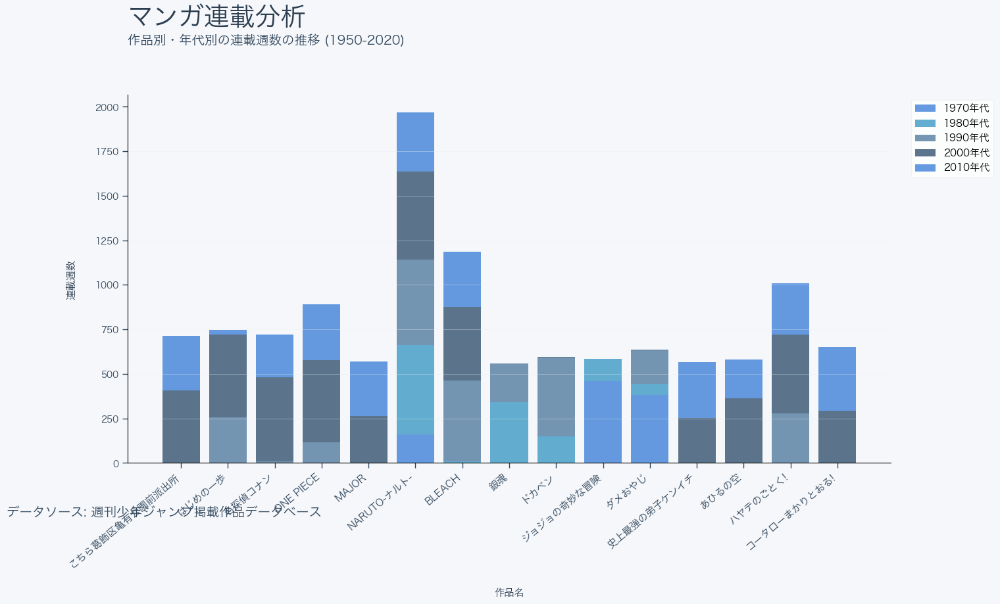

In [59]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from matplotlib.font_manager import FontProperties
from matplotlib.gridspec import GridSpec
import matplotlib as mpl

mpl.style.use('default')

MD3_COLORS = {
    'primary': '#4B89DC',      # Soft Blue
    'secondary': '#48A0C8',    # Light Blue
    'tertiary': '#5D84A6',     # Steel Blue
    'quaternary': '#405D78',   # Dark Blue
    'neutral_darker': '#2C3E50',
    'neutral_dark': '#34495E',
    'neutral_medium': '#7F8C8D',
    'neutral_light': '#ECF0F1',
    'surface': '#FFFFFF',
    'background': '#F5F7FA'
}

def get_available_chinese_font():
    chinese_font_list = [
        'PingFang SC',
        'Hiragino Sans GB',
        'Microsoft YaHei',
        'STHeiti',
        'SimHei',
        'Arial Unicode MS'
    ]
    available_fonts = [f.name for f in mpl.font_manager.fontManager.ttflist]
    for font in chinese_font_list:
        if font in available_fonts:
            return font
    return 'Arial'

chinese_font = get_available_chinese_font()
plt.rcParams['font.family'] = chinese_font
plt.rcParams['axes.unicode_minus'] = False

file_path = "./data/episodes.csv"
df = pd.read_csv(file_path)
df['years'] = (pd.to_datetime(df['datePublished']).dt.year // 10) * 10
df_plot = df.groupby(['cname', 'years']).size().reset_index(name='weeks')
top_cnames = df['cname'].value_counts().head(15).index

all_combinations = pd.MultiIndex.from_product([top_cnames, df_plot['years'].unique()],
                                            names=['cname', 'years']).to_frame(index=False)
df_plot = pd.merge(all_combinations, df_plot, how='left', on=['cname', 'years']).fillna(0)

fig = plt.figure(figsize=(16, 9))
gs = GridSpec(2, 1, height_ratios=[1, 8], hspace=0.2)

title_font = FontProperties(family=chinese_font, size=28, weight='bold')
subtitle_font = FontProperties(family=chinese_font, size=14)
body_font = FontProperties(family=chinese_font, size=11)

ax_title = fig.add_subplot(gs[0])
ax_title.axis('off')
ax_title.text(0, 0.6, 'マンガ連載分析', 
              fontproperties=title_font, 
              color=MD3_COLORS['neutral_darker'])
ax_title.text(0, 0.2, '作品別・年代別の連載週数の推移 (1950-2020)',
              fontproperties=subtitle_font,
              color=MD3_COLORS['neutral_dark'])

ax = fig.add_subplot(gs[1])
ax.set_facecolor(MD3_COLORS['background'])
fig.patch.set_facecolor(MD3_COLORS['background'])

decades = sorted(df_plot['years'].unique())
colors = [MD3_COLORS['primary'], MD3_COLORS['secondary'],
          MD3_COLORS['tertiary'], MD3_COLORS['quaternary']]
color_map = {decade: colors[i % len(colors)] for i, decade in enumerate(decades)}

bottom = np.zeros(len(top_cnames))
for decade in decades:
    data = df_plot[df_plot['years'] == decade].sort_values('cname')
    heights = data['weeks'].values
    
    ax.bar(top_cnames, heights,
           bottom=bottom,
           label=f'{int(decade)}年代',
           color=color_map[decade],
           alpha=0.85)
    
    bottom += heights

ax.set_xlabel('作品名', fontproperties=body_font, color=MD3_COLORS['neutral_darker'], labelpad=20)
ax.set_ylabel('連載週数', fontproperties=body_font, color=MD3_COLORS['neutral_darker'], labelpad=20)
ax.tick_params(axis='both', colors=MD3_COLORS['neutral_dark'], length=6, width=1, labelsize=10)

labels = ax.get_xticklabels()
ax.set_xticklabels(labels, rotation=40, horizontalalignment='right', fontproperties=body_font)

ax.grid(True, axis='y', linestyle='-', linewidth=0.5, color=MD3_COLORS['neutral_light'], alpha=0.5)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

legend = ax.legend(bbox_to_anchor=(1.02, 1),
                  loc='upper left',
                  prop=body_font,
                  frameon=True,
                  edgecolor=MD3_COLORS['neutral_light'])

plt.figtext(0.01, 0.02,
            'データソース: 週刊少年ジャンプ掲載作品データベース',
            fontproperties=subtitle_font,
            color=MD3_COLORS['neutral_dark'])

plt.tight_layout()
plt.subplots_adjust(right=0.85)

plt.savefig('manga_publication_analysis.svg', dpi=300, bbox_inches='tight', pad_inches=0.24, facecolor=MD3_COLORS['background'])
plt.savefig('manga_publication_analysis.pdf', dpi=300, bbox_inches='tight', pad_inches=0.24, facecolor=MD3_COLORS['background'])

plt.show()

## Altairで再現2：[作品別出現回数(数量順位で上位10作品)]

In [ ]:
pip install pandas altair


Note: you may need to restart the kernel to use updated packages.


In [ ]:
import pandas as pd
import altair as alt

file_path = "./data/episodes.csv"
df = pd.read_csv(file_path)

df_plot = df['cname'].value_counts().reset_index()
df_plot.columns = ['cname', 'count']
df_plot = df_plot.head(10)

pie_chart = alt.Chart(df_plot).mark_arc().encode(
    theta=alt.Theta(field="count", type="quantitative", title="出現回数"),
    color=alt.Color(field="cname", type="nominal", title="作品名"),
    tooltip=["cname", "count"]
).properties(
    title="作品別出現回数",
    width=400,
    height=500
).configure_title(
    fontSize=16
)

pie_chart



alt.Chart(...)

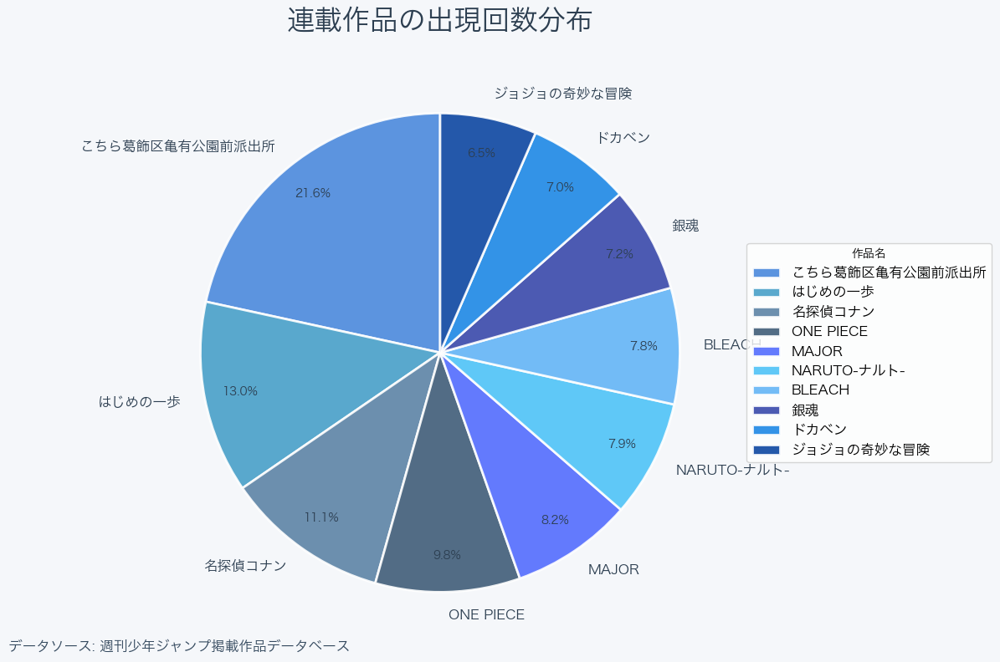

In [61]:
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib.font_manager import FontProperties
import matplotlib as mpl

MD3_COLORS = {
    'primary': '#4B89DC',      
    'secondary': '#48A0C8',    
    'tertiary': '#5D84A6',     
    'quaternary': '#405D78',   
    'additional_1': '#536DFE', 
    'additional_2': '#4FC3F7', 
    'additional_3': '#64B5F6', 
    'additional_4': '#3949AB', 
    'additional_5': '#1E88E5', 
    'additional_6': '#0D47A1', 
    'neutral_darker': '#2C3E50',
    'neutral_dark': '#34495E',
    'neutral_medium': '#7F8C8D',
    'neutral_light': '#ECF0F1',
    'background': '#F5F7FA'
}

def get_available_chinese_font():
    chinese_font_list = [
        'PingFang SC',
        'Hiragino Sans GB',
        'Microsoft YaHei',
        'STHeiti',
        'SimHei',
        'Arial Unicode MS'
    ]
    available_fonts = [f.name for f in mpl.font_manager.fontManager.ttflist]
    for font in chinese_font_list:
        if font in available_fonts:
            return font
    return 'Arial'

chinese_font = get_available_chinese_font()

file_path = "./data/episodes.csv"
df = pd.read_csv(file_path)
df_plot = df['cname'].value_counts().head(10)

fig, ax = plt.subplots(figsize=(12, 8), facecolor=MD3_COLORS['background'])
ax.set_facecolor(MD3_COLORS['background'])

title_font = FontProperties(family=chinese_font, size=24, weight='bold')
body_font = FontProperties(family=chinese_font, size=12)

colors = list(MD3_COLORS.values())[:10]
wedges, texts, autotexts = ax.pie(df_plot.values, 
                                 labels=df_plot.index,
                                 colors=colors,
                                 autopct='%1.1f%%',
                                 startangle=90,
                                 pctdistance=0.85,
                                 wedgeprops={'edgecolor': 'white', 
                                           'linewidth': 2,
                                           'alpha': 0.9})

plt.setp(autotexts, size=10, color=MD3_COLORS['neutral_darker'])
plt.setp(texts, size=10, color=MD3_COLORS['neutral_darker'], fontproperties=body_font)

plt.title('連載作品の出現回数分布',
         fontproperties=title_font,
         color=MD3_COLORS['neutral_darker'],
         pad=20)

plt.legend(wedges, df_plot.index,
          title="作品名",
          loc="center left",
          bbox_to_anchor=(1, 0, 0.5, 1),
          prop=body_font)

plt.figtext(0.01, 0.02,
            'データソース: 週刊少年ジャンプ掲載作品データベース',
            fontproperties=body_font,
            color=MD3_COLORS['neutral_dark'])

plt.tight_layout()

plt.savefig('manga_distribution.svg', dpi=300, bbox_inches='tight', pad_inches=0.24, facecolor=MD3_COLORS['background'])
plt.savefig('manga_distribution.pdf', dpi=300, bbox_inches='tight', pad_inches=0.24, facecolor=MD3_COLORS['background'])

plt.show()

## Altairで再現3：[各作品のページ数分布(上位10作品)]

In [ ]:
import pandas as pd
import altair as alt

file_path = "./data/episodes.csv"
df = pd.read_csv(file_path)

df_plot = df.groupby('cname')['pages'].sum().reset_index()
df_plot.columns = ['cname', 'total_pages']
df_plot = df_plot.sort_values('total_pages', ascending=False).head(10)

df_top_10 = df[df['cname'].isin(df_plot['cname'])]

distribution_chart = alt.Chart(df_top_10).mark_boxplot().encode(
    x=alt.X('cname:N', title='作品名', sort='-y'),
    y=alt.Y('pages:Q', title='ページ数'),
    color=alt.Color('cname:N', legend=None),
    tooltip=['cname', 'pages']
).properties(
    title="上位10作品のページ数分布",
    width=1000,
    height=500
).configure_axis(
    labelFontSize=12,
    titleFontSize=14
).configure_title(
    fontSize=16
)

distribution_chart


alt.Chart(...)

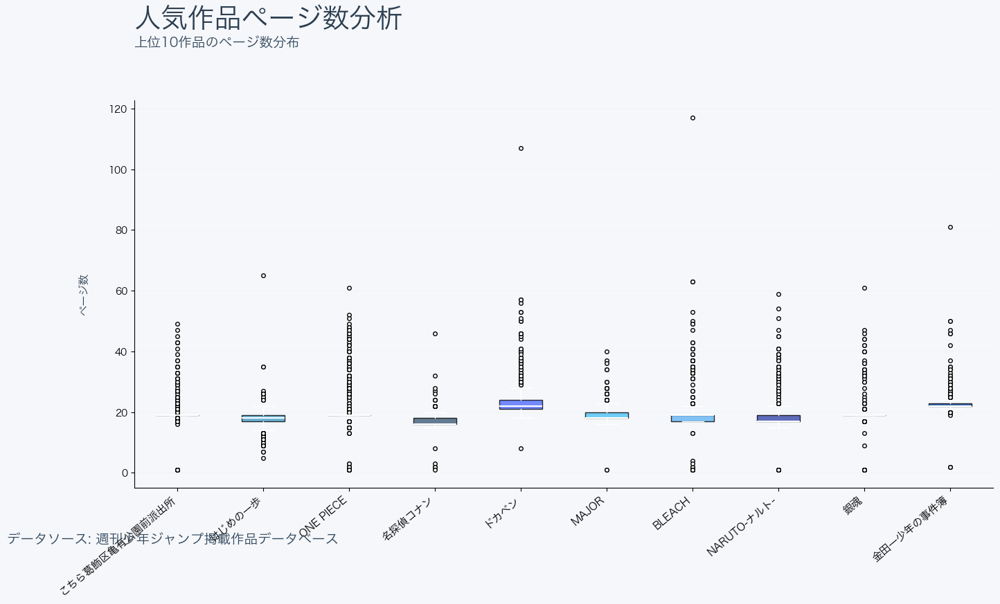

In [62]:
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib.font_manager import FontProperties
import matplotlib as mpl

MD3_COLORS = {
    'primary': '#4B89DC',      
    'secondary': '#48A0C8',    
    'tertiary': '#5D84A6',     
    'quaternary': '#405D78',   
    'additional_1': '#536DFE', 
    'additional_2': '#4FC3F7', 
    'additional_3': '#64B5F6', 
    'additional_4': '#3949AB', 
    'additional_5': '#1E88E5', 
    'additional_6': '#0D47A1', 
    'neutral_darker': '#2C3E50',
    'neutral_dark': '#34495E',
    'neutral_medium': '#7F8C8D',
    'neutral_light': '#ECF0F1',
    'background': '#F5F7FA'
}

def get_available_chinese_font():
    chinese_font_list = [
        'PingFang SC',
        'Hiragino Sans GB',
        'Microsoft YaHei',
        'STHeiti',
        'SimHei',
        'Arial Unicode MS'
    ]
    available_fonts = [f.name for f in mpl.font_manager.fontManager.ttflist]
    for font in chinese_font_list:
        if font in available_fonts:
            return font
    return 'Arial'

chinese_font = get_available_chinese_font()

file_path = "./data/episodes.csv"
df = pd.read_csv(file_path)
df_plot = df.groupby('cname')['pages'].sum().reset_index()
df_plot.columns = ['cname', 'total_pages']
df_plot = df_plot.sort_values('total_pages', ascending=False).head(10)
df_top_10 = df[df['cname'].isin(df_plot['cname'])]

fig = plt.figure(figsize=(16, 9))
gs = plt.GridSpec(2, 1, height_ratios=[1, 8], hspace=0.2)

title_font = FontProperties(family=chinese_font, size=28, weight='bold')
subtitle_font = FontProperties(family=chinese_font, size=14)
body_font = FontProperties(family=chinese_font, size=11)

ax_title = fig.add_subplot(gs[0])
ax_title.axis('off')
ax_title.text(0, 0.6, '人気作品ページ数分析', 
              fontproperties=title_font, 
              color=MD3_COLORS['neutral_darker'])
ax_title.text(0, 0.2, '上位10作品のページ数分布',
              fontproperties=subtitle_font,
              color=MD3_COLORS['neutral_dark'])

ax = fig.add_subplot(gs[1])
ax.set_facecolor(MD3_COLORS['background'])
fig.patch.set_facecolor(MD3_COLORS['background'])

colors = list(MD3_COLORS.values())[:10]
bp = ax.boxplot([df_top_10[df_top_10['cname'] == name]['pages'] for name in df_plot['cname']],
                patch_artist=True,
                medianprops=dict(color="white", linewidth=1.5),
                flierprops=dict(marker='o', markerfacecolor='white', markersize=4),
                whiskerprops=dict(color='white'),
                capprops=dict(color='white'))

for patch, color in zip(bp['boxes'], colors):
    patch.set_facecolor(color)
    patch.set_alpha(0.8)

ax.set_xticklabels(df_plot['cname'], rotation=40, ha='right', fontproperties=body_font)
ax.set_ylabel('ページ数', fontproperties=body_font, color=MD3_COLORS['neutral_darker'], labelpad=20)

ax.grid(True, axis='y', linestyle='-', linewidth=0.5, color=MD3_COLORS['neutral_light'], alpha=0.5)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.figtext(0.01, 0.02,
            'データソース: 週刊少年ジャンプ掲載作品データベース',
            fontproperties=subtitle_font,
            color=MD3_COLORS['neutral_dark'])

plt.tight_layout()

plt.savefig('manga_page_distribution.svg', dpi=300, bbox_inches='tight', pad_inches=0.24, facecolor=MD3_COLORS['background'])
plt.savefig('manga_page_distribution.pdf', dpi=300, bbox_inches='tight', pad_inches=0.24, facecolor=MD3_COLORS['background'])

plt.show()

---

この演習は以上です。